# 0. Import  & Initialisations

In [13]:
from ecg_qc import ecg_qc
import time
import numpy as np
import matplotlib.pyplot as plt
from joblib import load
from dtreeviz.trees import *
import pandas as pd
from sklearn import tree
from streamlit_visualization.modules.graph_generation import annot_classification_correspondance
from streamlit_visualization.modules.ecg_annoted_creation import ecg_annoted_creation, ecg_graph_generation
import seaborn as sns
from sklearn.metrics import f1_score, accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from streamlit_visualization.modules.import_ecg_segment import EdfLoader

There are two ecg datasets (df_ecg_{train/test}):
* train: from La Teppe, manually annoted by Aura, used for training model
* test: from physionet, annoted by doctors, used for validation
    
As models work with SQIs, there are two "processed" datasets (df_ecg_sqi_{train/test})

For predictions, there are two models for ecg_qc imported with class instances:
* ecg_qc_rfc : using random Forest Classifier
* ecg_qc_dtc : using Decision Tree Classifier

In [2]:
# Loading train ecg dataset
df_ecg_train = pd.read_pickle('/home/aura-research/ecg_qc_raw_data/df_consolidated_teppe.pkl')
df_ecg_train.head()

,annot_2,annot_3,record,signal
2020-12-18 13:00:00.000000000,1,1,emg6+emg6- 77,31.201648
2020-12-18 13:00:00.003906250,1,1,emg6+emg6- 77,-1.806668
2020-12-18 13:00:00.007812500,1,1,emg6+emg6- 77,-16.064698
2020-12-18 13:00:00.011718750,1,1,emg6+emg6- 77,-28.955520
2020-12-18 13:00:00.015625000,1,1,emg6+emg6- 77,-56.787976


In [3]:
# Loading test ecg dataset

patient = '103001'
target_annot = ['cons']
sampling_frequency = 1000
input_data_folder = '/home/aura-research/ecg_qc_raw_data'
output_folder = '/home/aura-research/ecg_qc_raw_data'

df_ecg_val = ecg_annoted_creation(patient=patient,
                     target_annot=target_annot,
                     sampling_frequency=sampling_frequency,
                     input_data_folder=input_data_folder,
                     output_folder=output_folder)
df_ecg_val.columns = ['signal']
df_ecg_val.head()

Starting ecg_annoted_creation for patient 103001


,ecg_signal
0.000,19295.427974
0.001,19077.595225
0.002,18874.530798
0.003,18706.541136
0.004,18515.783644


In [4]:
# Loading train dataset sqi

df_train_sqi = pd.read_csv('training_dataset/df_consolidated_ml.csv', index_col=0)
df_train_sqi.head()

,timestamp_start,timestamp_end,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score,annot_2,annot_3,record,consensus
0,2020-12-18 13:00:00.000000000,2020-12-18 13:00:02.000000000,1.000,0.501,1.924,6.664,0.499,0.967,1,1,emg6+emg6- 77,1
1,2020-12-18 13:00:02.000000000,2020-12-18 13:00:04.000000000,1.000,0.627,2.056,7.390,0.515,0.978,1,1,emg6+emg6- 77,1
2,2020-12-18 13:00:04.000000000,2020-12-18 13:00:06.000000000,0.857,0.820,1.333,3.494,0.484,0.975,1,1,emg6+emg6- 77,1
3,2020-12-18 13:00:06.000000000,2020-12-18 13:00:08.000000000,1.000,0.499,0.884,2.709,0.468,0.930,1,1,emg6+emg6- 77,1
4,2020-12-18 13:00:08.000000000,2020-12-18 13:00:10.000000000,1.000,0.482,1.817,5.480,0.433,0.991,1,1,emg6+emg6- 77,1


In [5]:
# Loading val dataset sqi

df_val_sqi = pd.read_csv('validation_dataset/df_ml_103001_2s.csv')
df_val_sqi.head()

,timestamp_start,timestamp_end,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score,classif,classif_avg
0,28800001,28802000,0.500,0.768,3.127,11.738,0.510,0.985,1,1.0
1,28802001,28804000,1.000,0.672,3.325,13.034,0.519,0.979,1,1.0
2,28804001,28806000,1.000,0.588,3.772,16.345,0.513,0.974,1,1.0
3,28806001,28808000,0.500,0.000,3.122,12.985,0.526,0.983,1,1.0
4,28808001,28810000,0.667,1.164,3.114,11.619,0.518,0.980,1,1.0


# I. Importing ecg_qc models and making predictions

In [14]:
### Initialisation of ecg_qc instances

ecg_qc_rfc = ecg_qc(model='training_dataset/model_2s_rfc_normalized_premium.pkl',
                      normalized=True)
#ecg_qc_rfc = ecg_qc(normalized=False)
ecg_qc_dtc = ecg_qc(model='training_dataset/model_dtc_direct.pkl',
                     normalized=False)

try:
    ecg_qc_rfc.model = ecg_qc_rfc.model.best_estimator_
except:
    pass

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/scikit_learn-0.24.1-py3.6-linux-x86_64.egg/sklearn/base.py:315: UserWarning:

Trying to unpickle estimator StandardScaler from version 0.23.2 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/scikit_learn-0.24.1-py3.6-linux-x86_64.egg/sklearn/base.py:315: UserWarning:

Trying to unpickle estimator OneHotEncoder from version 0.23.2 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/scikit_learn-0.24.1-py3.6-linux-x86_64.egg/sklearn/base.py:315: UserWarning:

Trying to unpickle estimator ColumnTransformer from version 0.23.2 when using version 0.24.1. This might lead to breaking code or invalid results. Use at your own risk.

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3

In [7]:
# Adding predictions to datasets

for dataframe in [df_train_sqi, df_val_sqi]:

    dataframe['rfc_pred'] = [ecg_qc_rfc.predict_quality([x]) for x in dataframe.iloc[:, 2:8].values]
    dataframe['dtc_pred'] = [ecg_qc_dtc.predict_quality([x]) for x in dataframe.iloc[:, 2:8].values]
    
df_val_sqi['consensus'] = df_val_sqi['classif']

In [8]:
# Compute score for both dataset and both models

for dataframe in [df_train_sqi, df_val_sqi]:
    for col in ['rfc_pred', 'dtc_pred']:

        print(f'{col}:')
        print(f"f1_score : {f1_score(dataframe[col].values, dataframe['consensus'].values)}")
        print(f"accuracy_score: {accuracy_score(dataframe[col].values, dataframe['consensus'].values)}")
        print(dataframe['consensus'].value_counts()/dataframe.shape[0])
        print('\n')

rfc_pred:
f1_score : 0.7920771965464702
accuracy_score: 0.6898484848484848
1    0.593333
0    0.406667
Name: consensus, dtype: float64


dtc_pred:
f1_score : 0.9676610679368264
accuracy_score: 0.9609090909090909
1    0.593333
0    0.406667
Name: consensus, dtype: float64


rfc_pred:
f1_score : 0.676300578034682
accuracy_score: 0.5333333333333333
1    0.6625
0    0.3375
Name: consensus, dtype: float64


dtc_pred:
f1_score : 0.6263020833333334
accuracy_score: 0.5216666666666666
1    0.6625
0    0.3375
Name: consensus, dtype: float64




In [9]:
df_train_sqi.iloc[:,2:8].describe()

,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score
count,6600.000000,6600.000000,6600.000000,6600.000000,6600.000000,6600.000000
mean,0.655783,0.675578,1.724129,9.954305,0.454387,0.949241
std,0.275371,0.164303,2.192340,12.758009,0.066733,0.052338
min,0.000000,0.000000,-2.995000,-1.851000,0.157000,0.421000
25%,0.500000,0.549000,-0.028000,0.780500,0.438000,0.933000
50%,0.667000,0.661000,1.290000,4.125500,0.465000,0.967000
75%,0.800000,0.795000,2.877000,12.846250,0.485000,0.983000
max,1.000000,1.409000,11.564000,143.106000,0.733000,1.000000


In [10]:
df_val_sqi.iloc[:,2:8].describe()

,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score
count,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,0.621078,0.668428,3.599284,15.732582,0.522501,0.977787
std,0.277671,0.311750,0.672979,4.511184,0.020708,0.014149
min,0.000000,0.000000,-0.373000,0.471000,0.434000,0.872000
25%,0.500000,0.551750,3.186500,12.228250,0.514000,0.971750
50%,0.667000,0.679000,3.647500,15.114000,0.525000,0.980000
75%,0.800000,0.856250,4.090250,19.560500,0.534000,0.987000
max,1.000000,1.404000,4.823000,26.217000,0.599000,0.999000


In [11]:
df_train_sqi.iloc[:,2:8].describe() - df_val_sqi.iloc[:,2:8].describe()

,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score
count,5400.000000,5400.000000,5400.000000,5400.000000,5400.000000,5400.000000
mean,0.034704,0.007150,-1.875155,-5.778277,-0.068114,-0.028546
std,-0.002300,-0.147447,1.519361,8.246825,0.046024,0.038188
min,0.000000,0.000000,-2.622000,-2.322000,-0.277000,-0.451000
25%,0.000000,-0.002750,-3.214500,-11.447750,-0.076000,-0.038750
50%,0.000000,-0.018000,-2.357500,-10.988500,-0.060000,-0.013000
75%,0.000000,-0.061250,-1.213250,-6.714250,-0.049000,-0.004000
max,0.000000,0.005000,6.741000,116.889000,0.134000,0.001000


In [12]:
# Working cases
df_train_ = df_train_sqi[df_train_sqi['consensus'] == df_train_sqi['dtc_pred']]
df_val_ = df_val_sqi[df_val_sqi['consensus'] == df_val_sqi['dtc_pred']]

df_train_.iloc[:,2:8].describe() - df_val_.iloc[:,2:8].describe()

,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score
count,5716.000000,5716.000000,5716.000000,5716.000000,5716.000000,5716.000000
mean,-0.013253,-0.073719,-1.756745,-4.779560,-0.069187,-0.027274
std,0.033159,-0.120096,1.539260,8.478286,0.050387,0.038090
min,0.000000,0.000000,-2.622000,-2.322000,-0.277000,-0.451000
25%,0.000000,-0.049500,-3.223750,-11.109250,-0.079000,-0.034000
50%,0.000000,-0.080000,-2.019500,-9.221000,-0.059000,-0.012000
75%,0.000000,-0.116250,-1.003250,-4.571500,-0.045750,-0.003000
max,0.000000,0.005000,6.801000,118.101000,0.134000,0.001000


In [13]:
df_train_.iloc[:,2:8].describe() 

,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score
count,6342.000000,6342.000000,6342.000000,6342.000000,6342.000000,6342.000000
mean,0.650863,0.676316,1.746178,10.184616,0.452987,0.950829
std,0.276360,0.164551,2.223179,12.921882,0.067158,0.051684
min,0.000000,0.000000,-2.995000,-1.851000,0.157000,0.421000
25%,0.500000,0.549250,-0.073500,0.779000,0.437000,0.938000
50%,0.667000,0.662000,1.306000,4.199000,0.465000,0.968000
75%,0.800000,0.796000,2.989750,13.771750,0.484000,0.984000
max,1.000000,1.409000,11.564000,143.106000,0.733000,1.000000


In [14]:
df_val_.iloc[:,2:8].describe() 

,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score
count,626.000000,626.000000,626.000000,626.000000,626.000000,626.000000
mean,0.664117,0.750035,3.502923,14.964176,0.522174,0.978102
std,0.243201,0.284647,0.683919,4.443597,0.016771,0.013594
min,0.000000,0.000000,-0.373000,0.471000,0.434000,0.872000
25%,0.500000,0.598750,3.150250,11.888250,0.516000,0.972000
50%,0.667000,0.742000,3.325500,13.420000,0.524000,0.980000
75%,0.800000,0.912250,3.993000,18.343250,0.529750,0.987000
max,1.000000,1.404000,4.763000,25.005000,0.599000,0.999000


In [15]:
# sSQi and kSqi are issues

In [16]:
# Global - working
df_train_sqi.iloc[:,2:8].describe() - df_val_sqi.iloc[:,2:8].describe() - (df_train_.iloc[:,2:8].describe() - df_val_.iloc[:,2:8].describe())

,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score
count,-316.000000,-316.000000,-316.000000,-316.000000,-316.000000,-316.000000
mean,0.047958,0.080869,-0.118409,-0.998717,0.001073,-0.001272
std,-0.035459,-0.027351,-0.019899,-0.231460,-0.004363,0.000098
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.046750,0.009250,-0.338500,0.003000,-0.004750
50%,0.000000,0.062000,-0.338000,-1.767500,-0.001000,-0.001000
75%,0.000000,0.055000,-0.210000,-2.142750,-0.003250,-0.001000
max,0.000000,0.000000,-0.060000,-1.212000,0.000000,0.000000


In [17]:
# Not Working cases
df_train_ = df_train_sqi[df_train_sqi['consensus'] != df_train_sqi['dtc_pred']]
df_val_ = df_val_sqi[df_val_sqi['consensus'] != df_val_sqi['dtc_pred']]

df_train_.iloc[:,2:8].describe() - df_val_.iloc[:,2:8].describe()

,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score
count,-316.000000,-316.000000,-316.000000,-316.000000,-316.000000,-316.000000
mean,0.202568,0.078009,-2.522231,-12.277648,-0.034055,-0.067237
std,-0.086604,-0.158576,0.431057,0.669127,0.018474,0.038509
min,0.000000,0.000000,-2.756000,-3.050000,-0.045000,-0.183000
25%,0.267000,0.027750,-2.758250,-12.548750,-0.048000,-0.092500
50%,0.229000,0.014000,-2.765500,-13.112000,-0.046000,-0.059500
75%,0.200000,-0.006250,-2.413750,-14.513250,-0.030000,-0.036500
max,0.000000,-0.179000,0.740000,9.675000,0.121000,-0.006000


In [18]:
df_train_.iloc[:,2:8].describe() 

,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score
count,258.000000,258.000000,258.000000,258.000000,258.000000,258.000000
mean,0.776709,0.657438,1.182143,4.292953,0.488802,0.910205
std,0.217680,0.157301,1.076263,5.107356,0.042770,0.053244
min,0.000000,0.000000,-2.266000,-1.371000,0.394000,0.710000
25%,0.667000,0.534000,0.494000,0.951500,0.464000,0.877500
50%,0.800000,0.639000,1.054000,2.867500,0.483000,0.920500
75%,1.000000,0.775250,1.781500,6.132500,0.508000,0.951500
max,1.000000,1.218000,5.563000,35.892000,0.699000,0.993000


In [19]:
df_val_.iloc[:,2:8].describe() 

,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score
count,574.000000,574.000000,574.000000,574.000000,574.000000,574.000000
mean,0.574141,0.579429,3.704375,16.570601,0.522857,0.977443
std,0.304284,0.315877,0.645206,4.438230,0.024297,0.014736
min,0.000000,0.000000,0.490000,1.679000,0.439000,0.893000
25%,0.400000,0.506250,3.252250,13.500250,0.512000,0.970000
50%,0.571000,0.625000,3.819500,15.979500,0.529000,0.980000
75%,0.800000,0.781500,4.195250,20.645750,0.538000,0.988000
max,1.000000,1.397000,4.823000,26.217000,0.578000,0.999000


In [20]:
# Global - not Working
df_train_sqi.iloc[:,2:8].describe() - df_val_sqi.iloc[:,2:8].describe() - (df_train_.iloc[:,2:8].describe() - df_val_.iloc[:,2:8].describe())

,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score
count,5716.000000,5716.000000,5716.000000,5716.000000,5716.000000,5716.000000
mean,-0.167864,-0.070860,0.647076,6.499370,-0.034059,0.038691
std,0.084304,0.011129,1.088304,7.577699,0.027551,-0.000321
min,0.000000,0.000000,0.134000,0.728000,-0.232000,-0.268000
25%,-0.267000,-0.030500,-0.456250,1.101000,-0.028000,0.053750
50%,-0.229000,-0.032000,0.408000,2.123500,-0.014000,0.046500
75%,-0.200000,-0.055000,1.200500,7.799000,-0.019000,0.032500
max,0.000000,0.184000,6.001000,107.214000,0.013000,0.007000


In [21]:
# Trying with simpler elements

df_simple = df_train_sqi.loc[:, ['qSQI_score', 'cSQI_score', 'pSQI_score', 'basSQI_score']]
X_simple = df_simple.values
y = df_train_sqi['consensus'].tolist()
model = DecisionTreeClassifier()

algo = DecisionTreeClassifier()
params = {'min_samples_leaf': np.arange(1, 5, 1),
      'max_depth': np.arange(2, 25, 1),
      'max_features': [4]
      }
grid_search = GridSearchCV(estimator=algo,
                       param_grid=params,
                       scoring='f1',
                       cv=5,
                       verbose=5,
                       n_jobs=-1)

grid_search.fit(X_simple, y)
y_pred = grid_search.predict(X_simple)
print(f'f1_score : {f1_score(y, y_pred)}')
print(f'accuracy_score : {accuracy_score(y, y_pred)}')

print('\n val')
X_val = df_val_sqi.loc[:, ['qSQI_score', 'cSQI_score', 'pSQI_score', 'basSQI_score']].values
y_val = df_val_sqi['consensus'].values
y_pred_val = grid_search.predict(X_val)
print(f'f1_score : {f1_score(y_val, y_pred_val)}')
print(f'accuracy_score : {accuracy_score(y_val, y_pred_val)}')

Fitting 5 folds for each of 92 candidates, totalling 460 fits
f1_score : 0.8814753905791143
accuracy_score : 0.8471212121212122

 val
f1_score : 0.5850622406639004
accuracy_score : 0.5


# II. Random Forest tests

In [66]:
forest = ecg_qc_rfc.model

sqi_names = ['q_sqi_score', 'c_sqi_score', 's_sqi_score',
             'k_sqi_score', 'p_sqi_score', 'bas_sqi_score']
feature_names = sqi_names

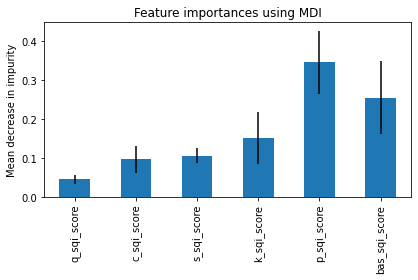

In [23]:
# Importance des features

importances = forest.feature_importances_
std = np.std([
    tree.feature_importances_ for tree in forest.estimators_], axis=0)

forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

# III. Decision Tree Classifer

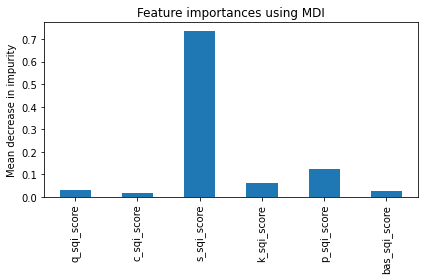

In [24]:
# Importance des features

importances = ecg_qc_dtc.model.feature_importances_
forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [25]:
# Train dataset tree

dataset = df_train_sqi
model = ecg_qc_dtc.model

X = dataset.iloc[:, 2:8].values
y_pred = dataset['dtc_pred'].tolist()
y_true = np.array(dataset['consensus'].values)

print(f'True :{dataset["consensus"].values[0]}')
print(f'Pred :{dataset["dtc_pred"].values[0]}')


viz = dtreeviz(model, X, y_true,
            target_name='quality',
            feature_names=feature_names,
            class_names=['noise', 'clean'])

viz

True :1
Pred :1


2021-08-05 15:56:22.416 WARNING matplotlib.font_manager: findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
2021-08-05 15:56:22.433 WARNING matplotlib.font_manager: findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
2021-08-05 15:56:50.799 WARNING matplotlib.font_manager: findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


True :1
Pred :1


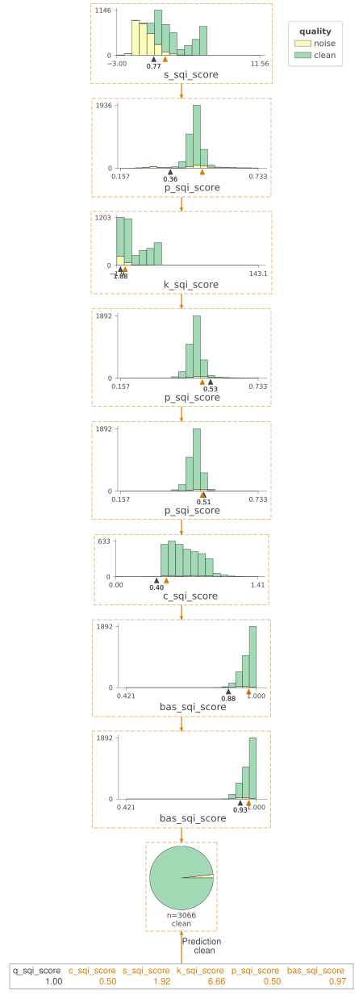

In [26]:
# Train dataset Example

dataset = df_train_sqi
model = ecg_qc_dtc.model

X = dataset.iloc[:, 2:8].values
y_pred = dataset['dtc_pred'].tolist()
y_true = np.array(dataset['consensus'].values)

print(f'True :{dataset["consensus"].values[0]}')
print(f'Pred :{dataset["dtc_pred"].values[0]}')


viz = dtreeviz(model, X, y_true,
            target_name='quality',
            feature_names=feature_names,
            class_names=['noise', 'clean'],
            X=X[0],
            show_just_path=True)

viz

In [27]:
# Val dataset decision tree

dataset = df_val_sqi
model = ecg_qc_dtc.model

X = dataset.iloc[:, 2:8].values
y_pred = dataset['dtc_pred'].tolist()
y_true = np.array(dataset['consensus'].values)

print(f'True :{dataset["consensus"].values[0]}')
print(f'Pred :{dataset["dtc_pred"].values[0]}')


viz = dtreeviz(model, X, y_true,
            target_name='quality',
            feature_names=feature_names,
            class_names=['noise', 'clean'])

viz

True :1
Pred :1


# IV. Kmeans

In [28]:
# Determining optimal Kmeans with elbow method for TRAIN

X_kmeans = df_train_sqi.iloc[:, 2:8]

wcss =  []
k = []
for i in range (1,11): 
    kmeans = KMeans(n_clusters= i, init = "k-means++", random_state = 0)
    kmeans.fit(X_kmeans)
    wcss.append(kmeans.inertia_)
    k.append(i)
    print("WCSS for K={} --> {}".format(i, wcss[-1]))


wcss_frame = pd.DataFrame(wcss)
k_frame = pd.Series(k)


fig= px.line(
    wcss_frame,
    x=k_frame,
    y=wcss_frame.iloc[:,-1]
)


fig.update_layout(
    yaxis_title="Inertia",
    xaxis_title="# Clusters",
    title="Inertia per cluster")
fig.show()

WCSS for K=1 --> 1106541.2296100953
WCSS for K=2 --> 170442.42312571823
WCSS for K=3 --> 90369.77227055431
WCSS for K=4 --> 46876.441243868205
WCSS for K=5 --> 33251.279992839605
WCSS for K=6 --> 21819.05616953372
WCSS for K=7 --> 16717.432905491656
WCSS for K=8 --> 13182.20550288607
WCSS for K=9 --> 10646.04638140345
WCSS for K=10 --> 9109.083239424419


In [29]:
# Determining optimal Kmeans with elbow method for TRAIN

X_kmeans = df_train_sqi.iloc[:, 2:8]

wcss =  []
k = []
for i in range (1,11): 
    kmeans = KMeans(n_clusters= i, init = "k-means++", random_state = 0)
    kmeans.fit(X_kmeans)
    wcss.append(kmeans.inertia_)
    k.append(i)
    print("WCSS for K={} --> {}".format(i, wcss[-1]))


wcss_frame = pd.DataFrame(wcss)
k_frame = pd.Series(k)


fig= px.line(
    wcss_frame,
    x=k_frame,
    y=wcss_frame.iloc[:,-1]
)


fig.update_layout(
    yaxis_title="Inertia",
    xaxis_title="# Clusters",
    title="Inertia per cluster")
fig.show()

WCSS for K=1 --> 1106541.2296100953
WCSS for K=2 --> 170442.42312571823
WCSS for K=3 --> 90369.77227055431
WCSS for K=4 --> 46876.441243868205
WCSS for K=5 --> 33251.27999283961
WCSS for K=6 --> 21819.05616953372
WCSS for K=7 --> 16717.432905491656
WCSS for K=8 --> 13182.205502886072
WCSS for K=9 --> 10646.04638140345
WCSS for K=10 --> 9109.083239424419


<AxesSubplot:>

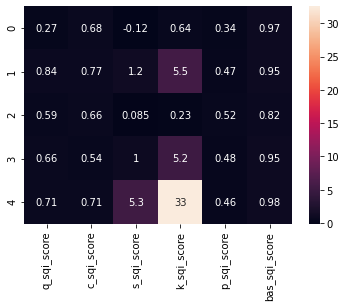

In [30]:
# With k=5, looking for centroids

# Import Standard Scaler
X = df_train_sqi.iloc[:,2:8].values

sc = StandardScaler()
X_kmeans = sc.fit_transform(X)
kmeans = KMeans(n_clusters=5, random_state=0, init="k-means++")
kmeans.fit(X_kmeans)


# Cluster centers coordinates
# Let's use inverse transform to have the real coordinates 
cluster_centers = sc.inverse_transform(kmeans.cluster_centers_)

# Create a heatmap 
sns.heatmap(pd.DataFrame(cluster_centers, columns=sqi_names),  annot=True)

In [31]:
# Adding sqis to datasets

# Kmeans for train    
X_train = df_train_sqi.iloc[:,2:8].values
sc_train = StandardScaler()
X_kmeans_train = sc_train.fit_transform(X_train)
kmeans_train = KMeans(n_clusters=5, random_state=0, init="k-means++")
kmeans_train.fit(X_kmeans_train)

# Kmeans for val
X_val = df_val_sqi.iloc[:,2:8].values
sc_val = StandardScaler()
X_kmeans_val = sc_val.fit_transform(X_val)
kmeans_val = KMeans(n_clusters=5, random_state=0, init="k-means++")
kmeans_val.fit(X_kmeans_val)

# Adding elements related to train kmeans
df_train_sqi['kmeans_train'] = kmeans_train.predict(X_kmeans_train)
df_val_sqi['kmeans_train'] = kmeans_train.predict(sc_train.transform(X_val))

# Adding elements related to val kmeans
df_train_sqi['kmeans_val'] = kmeans_val.predict(sc_val.transform(X_train))
df_val_sqi['kmeans_val'] = kmeans_val.predict(sc_train.transform(X_kmeans_val))

In [32]:
display(df_train_sqi.head())

,timestamp_start,timestamp_end,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score,annot_2,annot_3,record,consensus,rfc_pred,dtc_pred,kmeans_train,kmeans_val
0,2020-12-18 13:00:00.000000000,2020-12-18 13:00:02.000000000,1.000,0.501,1.924,6.664,0.499,0.967,1,1,emg6+emg6- 77,1,1,1,3,3
1,2020-12-18 13:00:02.000000000,2020-12-18 13:00:04.000000000,1.000,0.627,2.056,7.390,0.515,0.978,1,1,emg6+emg6- 77,1,1,1,1,4
2,2020-12-18 13:00:04.000000000,2020-12-18 13:00:06.000000000,0.857,0.820,1.333,3.494,0.484,0.975,1,1,emg6+emg6- 77,1,1,1,1,3
3,2020-12-18 13:00:06.000000000,2020-12-18 13:00:08.000000000,1.000,0.499,0.884,2.709,0.468,0.930,1,1,emg6+emg6- 77,1,1,1,3,3
4,2020-12-18 13:00:08.000000000,2020-12-18 13:00:10.000000000,1.000,0.482,1.817,5.480,0.433,0.991,1,1,emg6+emg6- 77,1,1,1,3,2


In [33]:
display(df_val_sqi.head())

,timestamp_start,timestamp_end,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score,classif,classif_avg,rfc_pred,dtc_pred,consensus,kmeans_train,kmeans_val
0,28800001,28802000,0.500,0.768,3.127,11.738,0.510,0.985,1,1.0,1,1,1,1,3
1,28802001,28804000,1.000,0.672,3.325,13.034,0.519,0.979,1,1.0,1,1,1,1,3
2,28804001,28806000,1.000,0.588,3.772,16.345,0.513,0.974,1,1.0,1,1,1,1,3
3,28806001,28808000,0.500,0.000,3.122,12.985,0.526,0.983,1,1.0,0,1,1,3,1
4,28808001,28810000,0.667,1.164,3.114,11.619,0.518,0.980,1,1.0,1,1,1,1,3


# V. Detailed analysis

## A. Train record/sqi split

In [34]:
for record in df_train_sqi['record'].unique():
    print(f'record : {record}')
    print(df_train_sqi[df_train_sqi['record'] == record]['kmeans_train'].value_counts()/df_train_sqi.shape[0])

record : emg6+emg6- 77
1    0.211970
3    0.160909
2    0.034242
4    0.001818
0    0.000152
Name: kmeans_train, dtype: float64
record : ECG1+ECG1- 11
0    0.160000
3    0.055909
1    0.049545
2    0.007273
Name: kmeans_train, dtype: float64
record : EMG1+EMG1- 3
4    0.211515
2    0.044394
3    0.031061
1    0.030909
0    0.000303
Name: kmeans_train, dtype: float64


In [35]:
for kmean in df_train_sqi['kmeans_train'].unique():
    print(f'kmean : {kmean}')
    print(df_train_sqi[df_train_sqi['kmeans_train'] == kmean]['record'].value_counts()/df_train_sqi.shape[0])

kmean : 3
emg6+emg6- 77    0.160909
ECG1+ECG1- 11    0.055909
EMG1+EMG1- 3     0.031061
Name: record, dtype: float64
kmean : 1
emg6+emg6- 77    0.211970
ECG1+ECG1- 11    0.049545
EMG1+EMG1- 3     0.030909
Name: record, dtype: float64
kmean : 2
EMG1+EMG1- 3     0.044394
emg6+emg6- 77    0.034242
ECG1+ECG1- 11    0.007273
Name: record, dtype: float64
kmean : 4
EMG1+EMG1- 3     0.211515
emg6+emg6- 77    0.001818
Name: record, dtype: float64
kmean : 0
ECG1+ECG1- 11    0.160000
EMG1+EMG1- 3     0.000303
emg6+emg6- 77    0.000152
Name: record, dtype: float64


## B. Testing on ECG1+ECG1-

In [42]:
df_ecg1 = df_ecg_train[df_ecg_train['record'] == 'ECG1+ECG1- 11']

In [43]:
start_frame = df_ecg1.index[0]
end_frame = start_frame + pd.Timedelta(seconds=20)

viz = ecg_graph_generation(df_ecg1, start_frame, end_frame, fs=256)
viz.show()

In [100]:
df_train_sqi['record'].unique()

array(['emg6+emg6- 77', 'ECG1+ECG1- 11', 'EMG1+EMG1- 3'], dtype=object)

In [107]:
df_train_sqi[df_train_sqi['record'] == 'EMG1+EMG1- 3']['consensus'].value_counts()

1    1594
0     506
Name: consensus, dtype: int64

In [105]:
df_train_sqi[df_train_sqi['record'] == 'emg6+emg6- 77']['consensus'].value_counts()

1    2320
0     380
Name: consensus, dtype: int64

In [104]:
df_train_sqi[df_train_sqi['record'] == 'ECG1+ECG1- 11']['consensus'].value_counts()

0    1798
1       2
Name: consensus, dtype: int64

## C. Wrong answers visualisation

In [53]:
df_wrong_answers_val = df_val_sqi[df_val_sqi['classif'] != df_val_sqi['dtc_pred']]
print(f'number of lines: {df_wrong_answers_val.shape[0]}')
df_wrong_answers_val.head()

number of lines: 574


,timestamp_start,timestamp_end,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score,classif,classif_avg,rfc_pred,dtc_pred,consensus,kmeans_train,kmeans_val
8,28816001,28818000,0.0,0.000,3.294,14.108,0.526,0.968,1,1.0,0,0,1,3,3
12,28824001,28826000,0.4,0.611,3.988,17.853,0.528,0.965,1,1.0,1,0,1,4,3
18,28836001,28838000,0.5,0.569,3.723,15.803,0.536,0.989,1,1.0,1,0,1,3,1
25,28850001,28852000,0.0,0.000,3.246,14.106,0.532,0.973,1,1.0,0,0,1,3,3
29,28858001,28860000,0.8,0.658,3.097,11.488,0.540,0.988,1,1.0,1,0,1,1,1


In [91]:
fs_val = 1000

for i in range(0, 100, 20):
    print(f'Index {i}')
    print(f'True value: {df_wrong_answers_val["consensus"].values[i]}')
    print(f'Predicted value: {df_wrong_answers_val["dtc_pred"].values[i]}')
    start_frame = df_wrong_answers_val['timestamp_start'].values[i]
    end_frame = start_frame + fs_val * 2

    start_frame, end_frame = start_frame/fs_val, end_frame/fs_val

    viz = ecg_graph_generation(df_ecg_val, start_frame, end_frame, fs=fs_val)
    viz.show()

Index 0
True value: 1
Predicted value: 0


Index 20
True value: 0
Predicted value: 1


Index 40
True value: 1
Predicted value: 0


Index 60
True value: 1
Predicted value: 0


Index 80
True value: 1
Predicted value: 0


In [162]:
# Analyser ces cas abérrants à partir de cas taggés bonnes qualité et mauvaise qualité

Index 40
True value: 1
Predicted value: 0
SQIs values: timestamp_start    2.908200e+07
timestamp_end      2.908400e+07
qSQI_score         1.000000e+00
cSQI_score         0.000000e+00
sSQI_score         3.312000e+00
kSQI_score         1.298600e+01
pSQI_score         5.000000e-01
basSQI_score       9.810000e-01
classif            1.000000e+00
classif_avg        1.000000e+00
rfc_pred           1.000000e+00
dtc_pred           0.000000e+00
consensus          1.000000e+00
kmeans_train       3.000000e+00
kmeans_val         3.000000e+00
Name: 141, dtype: float64


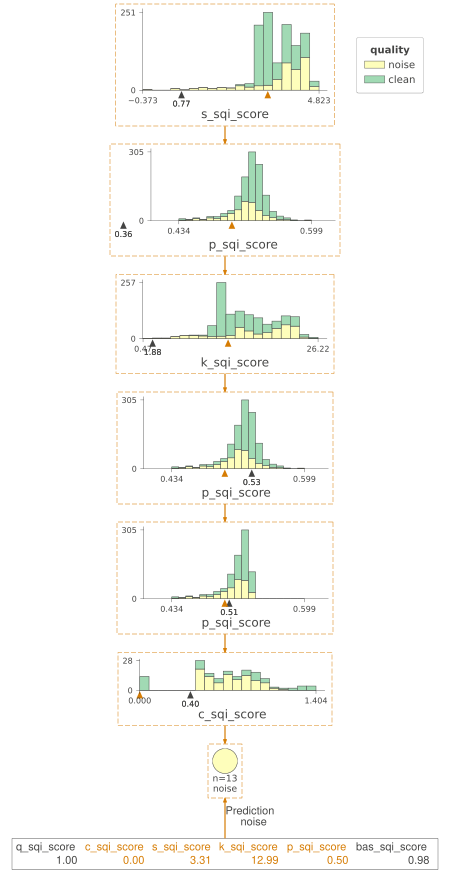

In [98]:
# Decision Path
i = 40

print(f'Index {i}')
print(f'True value: {df_wrong_answers_val["consensus"].values[i]}')
print(f'Predicted value: {df_wrong_answers_val["dtc_pred"].values[i]}')
print(f'SQIs values: {df_wrong_answers_val.iloc[i]}')

viz = dtreeviz(ecg_qc_dtc.model,
                df_val_sqi.iloc[:,2:8].values,
                df_val_sqi['consensus'].values,
                target_name='quality',
                feature_names=feature_names,
                class_names=['noise', 'clean'],
                X=df_wrong_answers_val.iloc[:,2:8].values[i],
                show_just_path=True)

viz

In [51]:
df_wrong_answers_val.head()

,timestamp_start,timestamp_end,qSQI_score,cSQI_score,sSQI_score,kSQI_score,pSQI_score,basSQI_score,classif,classif_avg,rfc_pred,dtc_pred,consensus,kmeans_train,kmeans_val
8,28816001,28818000,0.0,0.000,3.294,14.108,0.526,0.968,1,1.0,0,0,1,3,3
12,28824001,28826000,0.4,0.611,3.988,17.853,0.528,0.965,1,1.0,1,0,1,4,3
18,28836001,28838000,0.5,0.569,3.723,15.803,0.536,0.989,1,1.0,1,0,1,3,1
25,28850001,28852000,0.0,0.000,3.246,14.106,0.532,0.973,1,1.0,0,0,1,3,3
29,28858001,28860000,0.8,0.658,3.097,11.488,0.540,0.988,1,1.0,1,0,1,1,1


In [110]:
col = 'dtc_pred'
for record in df_train_sqi['record'].unique():
    dataframe = df_train_sqi[df_train_sqi['record'] == record]
    print(f'record : {record}')
    print(f'{col}:')
    print(f"f1_score : {f1_score(dataframe[col].values, dataframe['consensus'].values)}")
    print(f"accuracy_score: {accuracy_score(dataframe[col].values, dataframe['consensus'].values)}")
    print(dataframe['consensus'].value_counts()/dataframe.shape[0])
    print('\n')

record : emg6+emg6- 77
dtc_pred:
f1_score : 0.969309462915601
accuracy_score: 0.9466666666666667
1    0.859259
0    0.140741
Name: consensus, dtype: float64


record : ECG1+ECG1- 11
dtc_pred:
f1_score : 0.0
accuracy_score: 0.9983333333333333
0    0.998889
1    0.001111
Name: consensus, dtype: float64


record : EMG1+EMG1- 3
dtc_pred:
f1_score : 0.9661894608589704
accuracy_score: 0.9471428571428572
1    0.759048
0    0.240952
Name: consensus, dtype: float64




In [108]:
for record in df_train_sqi['record'].unique():
    print(f'record : {record}')
    print(df_train_sqi[df_train_sqi['record'] == record]['kmeans_train'].value_counts()/df_train_sqi.shape[0])

record : emg6+emg6- 77
1    0.211970
3    0.160909
2    0.034242
4    0.001818
0    0.000152
Name: kmeans_train, dtype: float64
record : ECG1+ECG1- 11
0    0.160000
3    0.055909
1    0.049545
2    0.007273
Name: kmeans_train, dtype: float64
record : EMG1+EMG1- 3
4    0.211515
2    0.044394
3    0.031061
1    0.030909
0    0.000303
Name: kmeans_train, dtype: float64


# VI. Testing with new data

In [10]:
loader = EdfLoader()
df_ecg_pat_4 = loader.convert_edf_to_dataframe(
    channel_name='ECG1+ECG1-')
df_ecg_pat_4.head()

,signal
2020-12-15 21:06:07.000000000,-15.869383
2020-12-15 21:06:07.003906250,-3.076219
2020-12-15 21:06:07.007812500,0.830091
2020-12-15 21:06:07.011718750,7.666133
2020-12-15 21:06:07.015625000,17.920195


In [34]:
from tqdm import tqdm

In [96]:
df_pat_4 = pd.DataFrame()
fs = 256


for iteration in tqdm(range(int(df_ecg_pat_4.shape[0]*2/fs))[:1000]):
    df_pat_4 = df_pat_4.append(
        [ecg_qc_dtc.compute_sqi_scores(df_ecg_pat_4['signal'].values[fs*iteration:fs*(iteration+2)])[0]],
        ignore_index=True)
    
df_pat_4.columns = sqi_names
df_pat_4['pred'] = [ecg_qc_dtc.predict_quality([df_pat_4.iloc[x, :]]) for x in range(df_pat_4.shape[0])]
df_pat_4.index = pd.date_range(start=df_ecg_pat_4.index[0], end=df_ecg_pat_4.index[0]+pd.Timedelta(seconds=2*df_pat_4.shape[0]), periods=df_pat_4.shape[0])
df_pat_4.head()

  0%|          | 0/1000 [00:00<?, ?it/s]/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning:

Mean of empty slice.

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/numpy/core/_methods.py:170: RuntimeWarning:

invalid value encountered in double_scalars

100%|██████████| 1000/1000 [00:15<00:00, 66.18it/s]


,q_sqi_score,c_sqi_score,s_sqi_score,k_sqi_score,p_sqi_score,bas_sqi_score,pred
2020-12-15 21:06:07.000000000,0,0,-1.475,1.302,0.454,0.983,0
2020-12-15 21:06:09.002002002,0,0,-1.448,1.268,0.434,0.891,0
2020-12-15 21:06:11.004004004,0,0,-1.283,0.953,0.424,0.915,0
2020-12-15 21:06:13.006006006,0,0,-1.021,0.057,0.440,0.993,0
2020-12-15 21:06:15.008008008,0,0,-1.129,0.180,0.528,0.904,0


In [122]:
ecg_qc_dtc.model.predict_proba([df_pat_4.iloc[0, 0:6].values])

array([[1., 0.]])

In [129]:
df_pat_4['proba'] = [ecg_qc_dtc.model.predict_proba([df_pat_4.iloc[x, 0:6]])[0][1] for x in range(df_pat_4.shape[0])]

In [131]:
df_pat_4['proba'].value_counts()

0.000000    890
0.166667     60
0.600000     50
Name: proba, dtype: int64

In [102]:
for i in range(0, df_pat_4.shape[0], 25):

    print(f'Index {i}')
    print(f'Predicted value: {df_pat_4["pred"].values[i]}')
    print(f'SQIs values: {df_pat_4.iloc[i]}')

    viz = ecg_graph_generation(df_ecg_pat_4, df_pat_4.index[i], df_pat_4.index[i+1], fs=256)
    viz.show()

Index 0
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.475
k_sqi_score      1.302
p_sqi_score      0.454
bas_sqi_score    0.983
pred             0.000
Name: 2020-12-15 21:06:07, dtype: float64
                                  signal
2020-12-15 21:06:07.000000000 -15.869383
2020-12-15 21:06:07.003906250  -3.076219
2020-12-15 21:06:07.007812500   0.830091
2020-12-15 21:06:07.011718750   7.666133
2020-12-15 21:06:07.015625000  17.920195


Index 25
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.189
k_sqi_score      0.374
p_sqi_score      0.434
bas_sqi_score    0.933
pred             0.000
Name: 2020-12-15 21:06:57.050050050, dtype: float64
                                  signal
2020-12-15 21:06:57.050781250  57.959869
2020-12-15 21:06:57.054687500  55.518425
2020-12-15 21:06:57.058593750  56.006714
2020-12-15 21:06:57.062500000  54.737163
2020-12-15 21:06:57.066406250  55.127794


Index 50
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.488
k_sqi_score      1.487
p_sqi_score      0.452
bas_sqi_score    0.865
pred             0.000
Name: 2020-12-15 21:07:47.100100100, dtype: float64
                                  signal
2020-12-15 21:07:47.101562500  -4.248112
2020-12-15 21:07:47.105468750  -6.005951
2020-12-15 21:07:47.109375000   2.392615
2020-12-15 21:07:47.113281250   5.420005
2020-12-15 21:07:47.117187500  30.322728


Index 75
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.325
k_sqi_score      0.663
p_sqi_score      0.457
bas_sqi_score    0.938
pred             0.000
Name: 2020-12-15 21:08:37.150150150, dtype: float64
                                  signal
2020-12-15 21:08:37.152343750  34.619669
2020-12-15 21:08:37.156250000  44.580758
2020-12-15 21:08:37.160156250  53.565270
2020-12-15 21:08:37.164062500  44.971389
2020-12-15 21:08:37.167968750  51.905089


Index 100
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score      0.331
k_sqi_score      0.511
p_sqi_score      0.414
bas_sqi_score    0.980
pred             0.000
Name: 2020-12-15 21:09:27.200200200, dtype: float64
                                  signal
2020-12-15 21:09:27.203125000  19.287404
2020-12-15 21:09:27.207031250  26.611734
2020-12-15 21:09:27.210937500  22.119478
2020-12-15 21:09:27.214843750  12.158389
2020-12-15 21:09:27.218750000  -2.978561


Index 125
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.033
k_sqi_score      0.045
p_sqi_score      0.415
bas_sqi_score    0.976
pred             0.000
Name: 2020-12-15 21:10:17.250250250, dtype: float64
                                   signal
2020-12-15 21:10:17.253906250   87.257191
2020-12-15 21:10:17.257812500  198.489357
2020-12-15 21:10:17.261718750   -7.666133
2020-12-15 21:10:17.265625000  -25.244526
2020-12-15 21:10:17.269531250   -3.466850


Index 150
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.275
k_sqi_score      0.869
p_sqi_score      0.463
bas_sqi_score    0.950
pred             0.000
Name: 2020-12-15 21:11:07.300300300, dtype: float64
                                  signal
2020-12-15 21:11:07.300781250  36.572824
2020-12-15 21:11:07.304687500  34.229038
2020-12-15 21:11:07.308593750  21.826505
2020-12-15 21:11:07.312500000  19.287404
2020-12-15 21:11:07.316406250  17.236591


Index 175
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.432
k_sqi_score      1.407
p_sqi_score      0.463
bas_sqi_score    0.867
pred             0.000
Name: 2020-12-15 21:11:57.350350350, dtype: float64
                                   signal
2020-12-15 21:11:57.351562500 -189.700160
2020-12-15 21:11:57.355468750 -192.532235
2020-12-15 21:11:57.359375000 -195.364309
2020-12-15 21:11:57.363281250 -196.731518
2020-12-15 21:11:57.367187500 -199.368276


Index 200
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.021
k_sqi_score      0.103
p_sqi_score      0.401
bas_sqi_score    0.949
pred             0.000
Name: 2020-12-15 21:12:47.400400400, dtype: float64
                                   signal
2020-12-15 21:12:47.402343750  -13.525597
2020-12-15 21:12:47.406250000  -60.205997
2020-12-15 21:12:47.410156250 -116.945144
2020-12-15 21:12:47.414062500 -141.847868
2020-12-15 21:12:47.417968750 -155.422293


Index 225
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -0.677
k_sqi_score      0.549
p_sqi_score      0.439
bas_sqi_score    0.878
pred             0.000
Name: 2020-12-15 21:13:37.450450450, dtype: float64
                                  signal
2020-12-15 21:13:37.453125000  69.385824
2020-12-15 21:13:37.457031250  67.530327
2020-12-15 21:13:37.460937500  63.624018
2020-12-15 21:13:37.464843750  60.205997
2020-12-15 21:13:37.468750000  60.205997


Index 250
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score      0.346
k_sqi_score      0.968
p_sqi_score      0.415
bas_sqi_score    0.910
pred             0.000
Name: 2020-12-15 21:14:27.500500500, dtype: float64
                                  signal
2020-12-15 21:14:27.503906250  35.693904
2020-12-15 21:14:27.507812500  23.486687
2020-12-15 21:14:27.511718750  21.533532
2020-12-15 21:14:27.515625000  62.647440
2020-12-15 21:14:27.519531250  56.495003


Index 275
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -0.935
k_sqi_score     -0.077
p_sqi_score      0.422
bas_sqi_score    0.955
pred             0.000
Name: 2020-12-15 21:15:17.550550550, dtype: float64
                                   signal
2020-12-15 21:15:17.550781250 -150.246433
2020-12-15 21:15:17.554687500 -130.031281
2020-12-15 21:15:17.558593750 -122.999924
2020-12-15 21:15:17.562500000 -112.550546
2020-12-15 21:15:17.566406250 -120.167849


Index 300
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.487
k_sqi_score      1.524
p_sqi_score      0.410
bas_sqi_score    0.828
pred             0.000
Name: 2020-12-15 21:16:07.600600600, dtype: float64
                                  signal
2020-12-15 21:16:07.601562500 -33.154803
2020-12-15 21:16:07.605468750 -49.365988
2020-12-15 21:16:07.609375000 -31.299306
2020-12-15 21:16:07.613281250 -40.381476
2020-12-15 21:16:07.617187500 -50.733196


Index 325
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.232
k_sqi_score      0.837
p_sqi_score      0.439
bas_sqi_score    0.999
pred             0.000
Name: 2020-12-15 21:16:57.650650650, dtype: float64
                                  signal
2020-12-15 21:16:57.652343750   1.025406
2020-12-15 21:16:57.656250000   6.494240
2020-12-15 21:16:57.660156250  -9.033341
2020-12-15 21:16:57.664062500 -11.084154
2020-12-15 21:16:57.667968750  -2.783246


Index 350
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score      0.004
k_sqi_score     -0.223
p_sqi_score      0.347
bas_sqi_score    0.681
pred             0.000
Name: 2020-12-15 21:17:47.700700700, dtype: float64
                                  signal
2020-12-15 21:17:47.703125000  45.654994
2020-12-15 21:17:47.707031250  43.506523
2020-12-15 21:17:47.710937500  42.139315
2020-12-15 21:17:47.714843750  43.701839
2020-12-15 21:17:47.718750000  41.162737


Index 375
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score      0.394
k_sqi_score      0.711
p_sqi_score      0.445
bas_sqi_score    0.941
pred             0.000
Name: 2020-12-15 21:18:37.750750750, dtype: float64
                                  signal
2020-12-15 21:18:37.753906250  42.920577
2020-12-15 21:18:37.757812500  43.408865
2020-12-15 21:18:37.761718750  48.682383
2020-12-15 21:18:37.765625000  48.682383
2020-12-15 21:18:37.769531250  46.143282


Index 400
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.495
k_sqi_score      1.608
p_sqi_score      0.418
bas_sqi_score    0.819
pred             0.000
Name: 2020-12-15 21:19:27.800800800, dtype: float64
                                   signal
2020-12-15 21:19:27.804687500    9.423972
2020-12-15 21:19:27.808593750   80.323491
2020-12-15 21:19:27.812500000  218.216220
2020-12-15 21:19:27.816406250   28.857862
2020-12-15 21:19:27.820312500   23.096056


Index 425
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.520
k_sqi_score      1.500
p_sqi_score      0.435
bas_sqi_score    0.869
pred             0.000
Name: 2020-12-15 21:20:17.850850850, dtype: float64
                                  signal
2020-12-15 21:20:17.851562500  70.655375
2020-12-15 21:20:17.855468750  70.948348
2020-12-15 21:20:17.859375000  71.534295
2020-12-15 21:20:17.863281250  68.116274
2020-12-15 21:20:17.867187500  68.897536


Index 450
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.152
k_sqi_score      0.208
p_sqi_score      0.493
bas_sqi_score    0.854
pred             0.000
Name: 2020-12-15 21:21:07.900900900, dtype: float64
                                  signal
2020-12-15 21:21:07.902343750  65.577173
2020-12-15 21:21:07.906250000  62.745098
2020-12-15 21:21:07.910156250  56.397345
2020-12-15 21:21:07.914062500  50.244907
2020-12-15 21:21:07.917968750  49.463645


Index 475
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.013
k_sqi_score     -0.021
p_sqi_score      0.414
bas_sqi_score    0.881
pred             0.000
Name: 2020-12-15 21:21:57.950950950, dtype: float64
                                  signal
2020-12-15 21:21:57.953125000  76.221866
2020-12-15 21:21:57.957031250  78.663310
2020-12-15 21:21:57.960937500  72.608530
2020-12-15 21:21:57.964843750  72.608530
2020-12-15 21:21:57.968750000  74.171054


Index 500
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -0.841
k_sqi_score      0.206
p_sqi_score      0.392
bas_sqi_score    0.945
pred             0.000
Name: 2020-12-15 21:22:48.001001001, dtype: float64
                                  signal
2020-12-15 21:22:48.003906250  48.780041
2020-12-15 21:22:48.007812500  71.534295
2020-12-15 21:22:48.011718750  81.593042
2020-12-15 21:22:48.015625000  78.663310
2020-12-15 21:22:48.019531250  82.276646


Index 525
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score      0.320
k_sqi_score      0.923
p_sqi_score      0.444
bas_sqi_score    0.830
pred             0.000
Name: 2020-12-15 21:23:38.051051051, dtype: float64
                                  signal
2020-12-15 21:23:38.054687500 -13.623255
2020-12-15 21:23:38.058593750 -13.232624
2020-12-15 21:23:38.062500000 -24.560922
2020-12-15 21:23:38.066406250 -24.853895
2020-12-15 21:23:38.070312500 -41.358053


Index 550
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.162
k_sqi_score      0.799
p_sqi_score      0.476
bas_sqi_score    0.919
pred             0.000
Name: 2020-12-15 21:24:28.101101101, dtype: float64
                                  signal
2020-12-15 21:24:28.101562500 -14.892805
2020-12-15 21:24:28.105468750 -15.576410
2020-12-15 21:24:28.109375000 -21.142901
2020-12-15 21:24:28.113281250 -28.564889
2020-12-15 21:24:28.117187500 -30.713359


Index 575
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.204
k_sqi_score      1.111
p_sqi_score      0.469
bas_sqi_score    0.862
pred             0.000
Name: 2020-12-15 21:25:18.151151151, dtype: float64
                                   signal
2020-12-15 21:25:18.152343750  -82.960250
2020-12-15 21:25:18.156250000 -131.593805
2020-12-15 21:25:18.160156250 -151.711299
2020-12-15 21:25:18.164062500 -162.258335
2020-12-15 21:25:18.167968750 -161.965362


Index 600
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.190
k_sqi_score      1.157
p_sqi_score      0.412
bas_sqi_score    0.871
pred             0.000
Name: 2020-12-15 21:26:08.201201201, dtype: float64
                                  signal
2020-12-15 21:26:08.203125000 -36.182193
2020-12-15 21:26:08.207031250 -24.756237
2020-12-15 21:26:08.210937500 -15.088121
2020-12-15 21:26:08.214843750 -17.236591
2020-12-15 21:26:08.218750000 -14.111543


Index 625
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.506
k_sqi_score      1.519
p_sqi_score      0.406
bas_sqi_score    0.821
pred             0.000
Name: 2020-12-15 21:26:58.251251251, dtype: float64
                                  signal
2020-12-15 21:26:58.253906250 -39.600214
2020-12-15 21:26:58.257812500 -29.150835
2020-12-15 21:26:58.261718750  -6.591897
2020-12-15 21:26:58.265625000   8.935683
2020-12-15 21:26:58.269531250   2.197299


Index 650
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score      0.527
k_sqi_score      0.779
p_sqi_score      0.425
bas_sqi_score    0.942
pred             0.000
Name: 2020-12-15 21:27:48.301301301, dtype: float64
                                  signal
2020-12-15 21:27:48.304687500 -17.627222
2020-12-15 21:27:48.308593750  -7.275502
2020-12-15 21:27:48.312500000   5.517662
2020-12-15 21:27:48.316406250  18.017853
2020-12-15 21:27:48.320312500  28.467231


Index 675
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.253
k_sqi_score      0.831
p_sqi_score      0.453
bas_sqi_score    0.958
pred             0.000
Name: 2020-12-15 21:28:38.351351351, dtype: float64
                                   signal
2020-12-15 21:28:38.351562500  -29.736782
2020-12-15 21:28:38.355468750  -34.717327
2020-12-15 21:28:38.359375000  -29.541466
2020-12-15 21:28:38.363281250   18.701457
2020-12-15 21:28:38.367187500  156.105898


Index 700
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.242
k_sqi_score      0.851
p_sqi_score      0.418
bas_sqi_score    0.895
pred             0.000
Name: 2020-12-15 21:29:28.401401401, dtype: float64
                                  signal
2020-12-15 21:29:28.402343750  17.334249
2020-12-15 21:29:28.406250000   7.373159
2020-12-15 21:29:28.410156250 -10.888838
2020-12-15 21:29:28.414062500 -57.373922
2020-12-15 21:29:28.417968750 -98.194858


Index 725
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.077
k_sqi_score      0.426
p_sqi_score      0.389
bas_sqi_score    0.911
pred             0.000
Name: 2020-12-15 21:30:18.451451451, dtype: float64
                                   signal
2020-12-15 21:30:18.453125000 -124.171817
2020-12-15 21:30:18.457031250 -116.163882
2020-12-15 21:30:18.460937500  -98.292515
2020-12-15 21:30:18.464843750  -78.467994
2020-12-15 21:30:18.468750000  -80.909438


Index 750
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -0.957
k_sqi_score     -0.040
p_sqi_score      0.403
bas_sqi_score    0.982
pred             0.000
Name: 2020-12-15 21:31:08.501501501, dtype: float64
                                  signal
2020-12-15 21:31:08.503906250  70.753033
2020-12-15 21:31:08.507812500  73.194476
2020-12-15 21:31:08.511718750  54.541848
2020-12-15 21:31:08.515625000  42.725261
2020-12-15 21:31:08.519531250  56.983291


Index 775
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score      0.090
k_sqi_score     -1.239
p_sqi_score      0.490
bas_sqi_score    0.578
pred             0.000
Name: 2020-12-15 21:31:58.551551551, dtype: float64
                                   signal
2020-12-15 21:31:58.554687500 -106.398108
2020-12-15 21:31:58.558593750 -126.515602
2020-12-15 21:31:58.562500000 -136.086061
2020-12-15 21:31:58.566406250  -99.855039
2020-12-15 21:31:58.570312500  -82.764935


Index 800
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score      0.469
k_sqi_score      0.782
p_sqi_score      0.420
bas_sqi_score    0.891
pred             0.000
Name: 2020-12-15 21:32:48.601601601, dtype: float64
                                  signal
2020-12-15 21:32:48.605468750  72.120241
2020-12-15 21:32:48.609375000  52.295720
2020-12-15 21:32:48.613281250  41.358053
2020-12-15 21:32:48.617187500  45.654994
2020-12-15 21:32:48.621093750  39.893187


Index 825
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -0.982
k_sqi_score     -0.018
p_sqi_score      0.486
bas_sqi_score    0.954
pred             0.000
Name: 2020-12-15 21:33:38.651651651, dtype: float64
                                  signal
2020-12-15 21:33:38.652343750   6.982528
2020-12-15 21:33:38.656250000   2.685588
2020-12-15 21:33:38.660156250   8.642710
2020-12-15 21:33:38.664062500  22.607767
2020-12-15 21:33:38.667968750  24.756237


Index 850
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.329
k_sqi_score      1.111
p_sqi_score      0.469
bas_sqi_score    0.812
pred             0.000
Name: 2020-12-15 21:34:28.701701701, dtype: float64
                                  signal
2020-12-15 21:34:28.703125000  29.150835
2020-12-15 21:34:28.707031250  19.189746
2020-12-15 21:34:28.710937500  16.162356
2020-12-15 21:34:28.714843750  17.920195
2020-12-15 21:34:28.718750000  13.623255


Index 875
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.112
k_sqi_score      0.057
p_sqi_score      0.501
bas_sqi_score    0.872
pred             0.000
Name: 2020-12-15 21:35:18.751751751, dtype: float64
                                   signal
2020-12-15 21:35:18.753906250  102.784771
2020-12-15 21:35:18.757812500   -7.275502
2020-12-15 21:35:18.761718750    7.177844
2020-12-15 21:35:18.765625000    9.619287
2020-12-15 21:35:18.769531250    8.838025


Index 900
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.446
k_sqi_score      1.571
p_sqi_score      0.461
bas_sqi_score    0.839
pred             0.000
Name: 2020-12-15 21:36:08.801801801, dtype: float64
                                  signal
2020-12-15 21:36:08.804687500  59.717708
2020-12-15 21:36:08.808593750  58.448157
2020-12-15 21:36:08.812500000  60.303655
2020-12-15 21:36:08.816406250  58.252842
2020-12-15 21:36:08.820312500  58.057527


Index 925
Predicted value: 1
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score      0.526
k_sqi_score      1.154
p_sqi_score      0.456
bas_sqi_score    0.869
pred             1.000
Name: 2020-12-15 21:36:58.851851851, dtype: float64
                                  signal
2020-12-15 21:36:58.855468750  71.534295
2020-12-15 21:36:58.859375000  70.655375
2020-12-15 21:36:58.863281250  67.530327
2020-12-15 21:36:58.867187500  67.725643
2020-12-15 21:36:58.871093750  64.893568


Index 950
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.435
k_sqi_score      1.631
p_sqi_score      0.442
bas_sqi_score    0.837
pred             0.000
Name: 2020-12-15 21:37:48.901901901, dtype: float64
                                   signal
2020-12-15 21:37:48.902343750 -145.363546
2020-12-15 21:37:48.906250000 -153.762112
2020-12-15 21:37:48.910156250 -157.473106
2020-12-15 21:37:48.914062500 -146.926070
2020-12-15 21:37:48.917968750  -80.421149


Index 975
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.313
k_sqi_score      1.287
p_sqi_score      0.440
bas_sqi_score    0.955
pred             0.000
Name: 2020-12-15 21:38:38.951951951, dtype: float64
                                  signal
2020-12-15 21:38:38.953125000  79.151598
2020-12-15 21:38:38.957031250  79.639887
2020-12-15 21:38:38.960937500  79.932860
2020-12-15 21:38:38.964843750  80.421149
2020-12-15 21:38:38.968750000  81.397726


<AxesSubplot:>

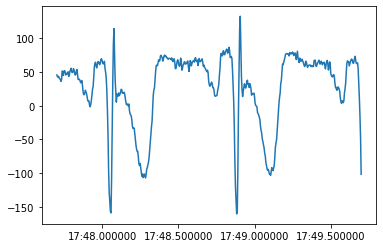

In [160]:
sns.lineplot(x=df_ecg_pat_4[df_ecg_pat_4.index > df_pat_4.index[350]].index.values[:512], y=df_ecg_pat_4[df_ecg_pat_4.index > df_pat_4.index[350]]['signal'].values[:512])

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

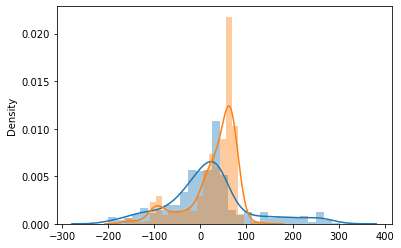

In [155]:
sns.distplot(df_ecg_pat_4[df_ecg_pat_4.index > df_pat_4.index[325]]['signal'].values[:512])
sns.distplot(df_ecg_pat_4[df_ecg_pat_4.index > df_pat_4.index[350]]['signal'].values[:512])

<AxesSubplot:ylabel='Frequency'>

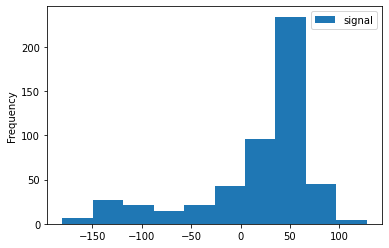

In [138]:
df_ecg_pat_4[df_ecg_pat_4.index >= df_ecg_pat_4.index[225]][:256*2].plot.hist()

In [104]:
df_pat_4['pred'].value_counts()

0    950
1     50
Name: pred, dtype: int64

In [105]:
df_temp = df_pat_4[df_pat_4['pred'] == 1]

In [114]:
for i in range(df_ecg_pat_4.shape[0]):

    print(f'Index {i}')
    print(f'Predicted value: {df_pat_4["pred"].values[i]}')
    print(f'SQIs values: {df_pat_4.iloc[i]}')

    viz = ecg_graph_generation(df_ecg_pat_4, df_temp.index[i], df_temp.index[i] + pd.Timedelta(seconds=2), fs=256)
    viz.show()

Index 0
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.475
k_sqi_score      1.302
p_sqi_score      0.454
bas_sqi_score    0.983
pred             0.000
Name: 2020-12-15 21:06:07, dtype: float64
                                  signal
2020-12-15 21:09:23.199218750  13.623255
2020-12-15 21:09:23.203125000  11.963073
2020-12-15 21:09:23.207031250  18.994430
2020-12-15 21:09:23.210937500  14.209201
2020-12-15 21:09:23.214843750  12.256046


Index 1
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.448
k_sqi_score      1.268
p_sqi_score      0.434
bas_sqi_score    0.891
pred             0.000
Name: 2020-12-15 21:06:09.002002002, dtype: float64
                                  signal
2020-12-15 21:09:25.199218750  50.928511
2020-12-15 21:09:25.203125000  50.147250
2020-12-15 21:09:25.207031250  55.225452
2020-12-15 21:09:25.210937500  56.397345
2020-12-15 21:09:25.214843750  55.420768


Index 2
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.283
k_sqi_score      0.953
p_sqi_score      0.424
bas_sqi_score    0.915
pred             0.000
Name: 2020-12-15 21:06:11.004004004, dtype: float64
                                  signal
2020-12-15 21:09:39.214843750  22.803082
2020-12-15 21:09:39.218750000  18.506142
2020-12-15 21:09:39.222656250  24.365606
2020-12-15 21:09:39.226562500  14.502174
2020-12-15 21:09:39.230468750  10.498207


Index 3
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.021
k_sqi_score      0.057
p_sqi_score      0.440
bas_sqi_score    0.993
pred             0.000
Name: 2020-12-15 21:06:13.006006006, dtype: float64
                                  signal
2020-12-15 21:09:41.214843750  68.702220
2020-12-15 21:09:41.218750000  51.905089
2020-12-15 21:09:41.222656250  43.311208
2020-12-15 21:09:41.226562500  52.295720
2020-12-15 21:09:41.230468750  59.717708


Index 4
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.129
k_sqi_score      0.180
p_sqi_score      0.528
bas_sqi_score    0.904
pred             0.000
Name: 2020-12-15 21:06:15.008008008, dtype: float64
                                  signal
2020-12-15 21:09:49.222656250  41.748684
2020-12-15 21:09:49.226562500  40.772107
2020-12-15 21:09:49.230468750  40.381476
2020-12-15 21:09:49.234375000  44.678416
2020-12-15 21:09:49.238281250  36.182193


Index 5
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.470
k_sqi_score      1.426
p_sqi_score      0.416
bas_sqi_score    0.830
pred             0.000
Name: 2020-12-15 21:06:17.010010010, dtype: float64
                                  signal
2020-12-15 21:14:03.476562500  66.065461
2020-12-15 21:14:03.480468750  72.217899
2020-12-15 21:14:03.484375000  71.534295
2020-12-15 21:14:03.488281250  70.460060
2020-12-15 21:14:03.492187500  73.585107


Index 6
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.268
k_sqi_score      0.930
p_sqi_score      0.485
bas_sqi_score    0.967
pred             0.000
Name: 2020-12-15 21:06:19.012012012, dtype: float64
                                  signal
2020-12-15 21:14:05.480468750 -37.940032
2020-12-15 21:14:05.484375000 -41.358053
2020-12-15 21:14:05.488281250 -43.213550
2020-12-15 21:14:05.492187500 -50.049592
2020-12-15 21:14:05.496093750 -47.901122


Index 7
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -0.956
k_sqi_score      0.068
p_sqi_score      0.413
bas_sqi_score    0.973
pred             0.000
Name: 2020-12-15 21:06:21.014014014, dtype: float64
                                  signal
2020-12-15 21:14:11.488281250  43.018235
2020-12-15 21:14:11.492187500  44.873732
2020-12-15 21:14:11.496093750  44.873732
2020-12-15 21:14:11.500000000  41.162737
2020-12-15 21:14:11.503906250  38.428321


Index 8
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.073
k_sqi_score      0.080
p_sqi_score      0.525
bas_sqi_score    0.933
pred             0.000
Name: 2020-12-15 21:06:23.016016016, dtype: float64
                                  signal
2020-12-15 21:14:35.511718750 -76.417182
2020-12-15 21:14:35.515625000 -44.092470
2020-12-15 21:14:35.519531250 -33.838407
2020-12-15 21:14:35.523437500  12.353704
2020-12-15 21:14:35.527343750  20.263981


Index 9
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.440
k_sqi_score      1.233
p_sqi_score      0.433
bas_sqi_score    0.880
pred             0.000
Name: 2020-12-15 21:06:25.018018018, dtype: float64
                                  signal
2020-12-15 21:18:15.730468750  53.272297
2020-12-15 21:18:15.734375000  54.346532
2020-12-15 21:18:15.738281250  54.444190
2020-12-15 21:18:15.742187500  55.616083
2020-12-15 21:18:15.746093750  52.100404


Index 10
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.324
k_sqi_score      1.046
p_sqi_score      0.447
bas_sqi_score    0.851
pred             0.000
Name: 2020-12-15 21:06:27.020020020, dtype: float64
                                   signal
2020-12-15 21:18:17.734375000  -76.807813
2020-12-15 21:18:17.738281250 -119.191272
2020-12-15 21:18:17.742187500 -143.801022
2020-12-15 21:18:17.746093750 -169.485008
2020-12-15 21:18:17.750000000 -168.703746


Index 11
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.000
k_sqi_score     -0.086
p_sqi_score      0.429
bas_sqi_score    0.891
pred             0.000
Name: 2020-12-15 21:06:29.022022022, dtype: float64
                                  signal
2020-12-15 21:18:25.742187500  78.858625
2020-12-15 21:18:25.746093750  74.757000
2020-12-15 21:18:25.750000000  63.916991
2020-12-15 21:18:25.753906250  63.624018
2020-12-15 21:18:25.757812500  66.749065


Index 12
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.088
k_sqi_score      0.104
p_sqi_score      0.524
bas_sqi_score    0.939
pred             0.000
Name: 2020-12-15 21:06:31.024024024, dtype: float64
                                  signal
2020-12-15 21:18:33.750000000  50.928511
2020-12-15 21:18:33.753906250  52.295720
2020-12-15 21:18:33.757812500  60.401312
2020-12-15 21:18:33.761718750  58.741131
2020-12-15 21:18:33.765625000  57.764553


Index 13
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.478
k_sqi_score      1.403
p_sqi_score      0.445
bas_sqi_score    0.869
pred             0.000
Name: 2020-12-15 21:06:33.026026026, dtype: float64
                                  signal
2020-12-15 21:18:35.750000000  72.803845
2020-12-15 21:18:35.753906250  77.393759
2020-12-15 21:18:35.757812500  78.565652
2020-12-15 21:18:35.761718750  77.100786
2020-12-15 21:18:35.765625000  73.682765


Index 14
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.375
k_sqi_score      1.138
p_sqi_score      0.471
bas_sqi_score    0.849
pred             0.000
Name: 2020-12-15 21:06:35.028028028, dtype: float64
                                  signal
2020-12-15 21:18:41.757812500  51.612116
2020-12-15 21:18:41.761718750  44.092470
2020-12-15 21:18:41.765625000  27.783627
2020-12-15 21:18:41.769531250  10.693523
2020-12-15 21:18:41.773437500 -16.552987


Index 15
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -0.993
k_sqi_score     -0.079
p_sqi_score      0.416
bas_sqi_score    0.941
pred             0.000
Name: 2020-12-15 21:06:37.030030030, dtype: float64
                                  signal
2020-12-15 21:18:43.757812500  65.381857
2020-12-15 21:18:43.761718750  70.069429
2020-12-15 21:18:43.765625000  65.772488
2020-12-15 21:18:43.769531250  57.080949
2020-12-15 21:18:43.773437500  55.127794


Index 16
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.100
k_sqi_score      0.152
p_sqi_score      0.524
bas_sqi_score    0.929
pred             0.000
Name: 2020-12-15 21:06:39.032032032, dtype: float64
                                  signal
2020-12-15 21:18:51.765625000  41.553368
2020-12-15 21:18:51.769531250  47.705806
2020-12-15 21:18:51.773437500  45.069047
2020-12-15 21:18:51.777343750  38.330663
2020-12-15 21:18:51.781250000  35.889220


Index 17
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.542
k_sqi_score      1.666
p_sqi_score      0.425
bas_sqi_score    0.829
pred             0.000
Name: 2020-12-15 21:06:41.034034034, dtype: float64
                                  signal
2020-12-15 21:19:03.777343750  57.080949
2020-12-15 21:19:03.781250000  49.073014
2020-12-15 21:19:03.785156250  50.635538
2020-12-15 21:19:03.789062500  50.440223
2020-12-15 21:19:03.792968750  57.276265


Index 18
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.425
k_sqi_score      1.305
p_sqi_score      0.432
bas_sqi_score    0.881
pred             0.000
Name: 2020-12-15 21:06:43.036036036, dtype: float64
                                  signal
2020-12-15 21:19:09.785156250 -26.807050
2020-12-15 21:19:09.789062500 -80.128176
2020-12-15 21:19:09.792968750 -57.666896
2020-12-15 21:19:09.796875000 -56.006714
2020-12-15 21:19:09.800781250 -57.666896


Index 19
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.151
k_sqi_score      0.446
p_sqi_score      0.391
bas_sqi_score    0.996
pred             0.000
Name: 2020-12-15 21:06:45.038038038, dtype: float64
                                  signal
2020-12-15 21:19:11.785156250 -16.064698
2020-12-15 21:19:11.789062500 -51.319142
2020-12-15 21:19:11.792968750 -26.514076
2020-12-15 21:19:11.796875000 -32.568856
2020-12-15 21:19:11.800781250 -27.588312


Index 20
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -0.986
k_sqi_score      0.010
p_sqi_score      0.510
bas_sqi_score    0.941
pred             0.000
Name: 2020-12-15 21:06:47.040040040, dtype: float64
                                  signal
2020-12-15 21:23:06.019531250  62.452125
2020-12-15 21:23:06.023437500  63.135729
2020-12-15 21:23:06.027343750  62.842756
2020-12-15 21:23:06.031250000  59.913024
2020-12-15 21:23:06.035156250  64.307622


Index 21
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.364
k_sqi_score      0.838
p_sqi_score      0.418
bas_sqi_score    0.857
pred             0.000
Name: 2020-12-15 21:06:49.042042042, dtype: float64
                                  signal
2020-12-15 21:23:08.023437500 -29.834440
2020-12-15 21:23:08.027343750 -33.057145
2020-12-15 21:23:08.031250000 -39.307240
2020-12-15 21:23:08.035156250 -38.428321
2020-12-15 21:23:08.039062500 -40.186160


Index 22
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.468
k_sqi_score      1.247
p_sqi_score      0.430
bas_sqi_score    0.890
pred             0.000
Name: 2020-12-15 21:06:51.044044044, dtype: float64
                                  signal
2020-12-15 21:23:10.023437500  57.666896
2020-12-15 21:23:10.027343750  60.498970
2020-12-15 21:23:10.031250000  62.549783
2020-12-15 21:23:10.035156250  62.452125
2020-12-15 21:23:10.039062500  58.350500


Index 23
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.186
k_sqi_score      0.681
p_sqi_score      0.423
bas_sqi_score    0.890
pred             0.000
Name: 2020-12-15 21:06:53.046046046, dtype: float64
                                  signal
2020-12-15 21:23:12.027343750 -58.252842
2020-12-15 21:23:12.031250000 -68.995193
2020-12-15 21:23:12.035156250 -73.878080
2020-12-15 21:23:12.039062500 -79.249256
2020-12-15 21:23:12.042968750 -87.061875


Index 24
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.017
k_sqi_score     -0.007
p_sqi_score      0.394
bas_sqi_score    0.893
pred             0.000
Name: 2020-12-15 21:06:55.048048048, dtype: float64
                                  signal
2020-12-15 21:23:36.050781250  34.522011
2020-12-15 21:23:36.054687500  46.143282
2020-12-15 21:23:36.058593750  37.744717
2020-12-15 21:23:36.062500000  40.186160
2020-12-15 21:23:36.066406250  34.033722


Index 25
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.189
k_sqi_score      0.374
p_sqi_score      0.434
bas_sqi_score    0.933
pred             0.000
Name: 2020-12-15 21:06:57.050050050, dtype: float64
                                  signal
2020-12-15 21:27:36.292968750  34.131380
2020-12-15 21:27:36.296875000  27.002365
2020-12-15 21:27:36.300781250  25.928130
2020-12-15 21:27:36.304687500  27.978943
2020-12-15 21:27:36.308593750  26.514076


Index 26
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.299
k_sqi_score      0.790
p_sqi_score      0.445
bas_sqi_score    0.944
pred             0.000
Name: 2020-12-15 21:06:59.052052052, dtype: float64
                                  signal
2020-12-15 21:27:42.296875000  44.678416
2020-12-15 21:27:42.300781250  44.483101
2020-12-15 21:27:42.304687500  49.951934
2020-12-15 21:27:42.308593750  51.514458
2020-12-15 21:27:42.312500000  53.858244


Index 27
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.022
k_sqi_score      0.076
p_sqi_score      0.374
bas_sqi_score    0.949
pred             0.000
Name: 2020-12-15 21:07:01.054054054, dtype: float64
                                  signal
2020-12-15 21:27:54.308593750  25.732815
2020-12-15 21:27:54.312500000  25.928130
2020-12-15 21:27:54.316406250  29.053178
2020-12-15 21:27:54.320312500  29.736782
2020-12-15 21:27:54.324218750  31.299306


Index 28
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.095
k_sqi_score      0.194
p_sqi_score      0.444
bas_sqi_score    0.928
pred             0.000
Name: 2020-12-15 21:07:03.056056056, dtype: float64
                                  signal
2020-12-15 21:28:12.328125000  31.885252
2020-12-15 21:28:12.332031250  22.510109
2020-12-15 21:28:12.335937500  19.189746
2020-12-15 21:28:12.339843750  24.658579
2020-12-15 21:28:12.343750000  24.072633


Index 29
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.340
k_sqi_score      0.926
p_sqi_score      0.414
bas_sqi_score    0.909
pred             0.000
Name: 2020-12-15 21:07:05.058058058, dtype: float64
                                   signal
2020-12-15 21:28:18.332031250   41.358053
2020-12-15 21:28:18.335937500  215.872435
2020-12-15 21:28:18.339843750   89.015030
2020-12-15 21:28:18.343750000   -2.685588
2020-12-15 21:28:18.347656250    5.908293


Index 30
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.340
k_sqi_score      1.035
p_sqi_score      0.441
bas_sqi_score    0.905
pred             0.000
Name: 2020-12-15 21:07:07.060060060, dtype: float64
                                  signal
2020-12-15 21:28:28.343750000  20.068666
2020-12-15 21:28:28.347656250  35.596246
2020-12-15 21:28:28.351562500  35.791562
2020-12-15 21:28:28.355468750  38.233005
2020-12-15 21:28:28.359375000  41.358053


Index 31
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.017
k_sqi_score     -0.021
p_sqi_score      0.405
bas_sqi_score    0.945
pred             0.000
Name: 2020-12-15 21:07:09.062062062, dtype: float64
                                  signal
2020-12-15 21:32:20.574218750  79.346914
2020-12-15 21:32:20.578125000  56.006714
2020-12-15 21:32:20.582031250  39.404898
2020-12-15 21:32:20.585937500  35.205615
2020-12-15 21:32:20.589843750  49.170672


Index 32
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.126
k_sqi_score      0.148
p_sqi_score      0.516
bas_sqi_score    0.932
pred             0.000
Name: 2020-12-15 21:07:11.064064064, dtype: float64
                                  signal
2020-12-15 21:32:30.585937500  51.416800
2020-12-15 21:32:30.589843750   2.880903
2020-12-15 21:32:30.593750000  17.529564
2020-12-15 21:32:30.597656250  43.115892
2020-12-15 21:32:30.601562500  64.698253


Index 33
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.499
k_sqi_score      1.463
p_sqi_score      0.434
bas_sqi_score    0.864
pred             0.000
Name: 2020-12-15 21:07:13.066066066, dtype: float64
                                  signal
2020-12-15 21:32:34.589843750  18.603799
2020-12-15 21:32:34.593750000  48.975357
2020-12-15 21:32:34.597656250  53.076982
2020-12-15 21:32:34.601562500  45.752651
2020-12-15 21:32:34.605468750  39.600214


Index 34
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.390
k_sqi_score      1.180
p_sqi_score      0.453
bas_sqi_score    0.868
pred             0.000
Name: 2020-12-15 21:07:15.068068068, dtype: float64
                                   signal
2020-12-15 21:32:46.601562500  -48.780041
2020-12-15 21:32:46.605468750  -87.159533
2020-12-15 21:32:46.609375000 -135.207141
2020-12-15 21:32:46.613281250 -161.281758
2020-12-15 21:32:46.617187500 -179.446098


Index 35
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.022
k_sqi_score     -0.023
p_sqi_score      0.417
bas_sqi_score    0.937
pred             0.000
Name: 2020-12-15 21:07:17.070070070, dtype: float64
                                  signal
2020-12-15 21:32:52.609375000  44.287785
2020-12-15 21:32:52.613281250  92.726024
2020-12-15 21:32:52.617187500  72.022583
2020-12-15 21:32:52.621093750  49.463645
2020-12-15 21:32:52.625000000  68.213931


Index 36
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.060
k_sqi_score      0.036
p_sqi_score      0.520
bas_sqi_score    0.917
pred             0.000
Name: 2020-12-15 21:07:19.072072072, dtype: float64
                                   signal
2020-12-15 21:32:54.609375000    3.466850
2020-12-15 21:32:54.613281250  188.137636
2020-12-15 21:32:54.617187500   13.720912
2020-12-15 21:32:54.621093750  -69.971771
2020-12-15 21:32:54.625000000  -55.616083


Index 37
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.470
k_sqi_score      1.383
p_sqi_score      0.434
bas_sqi_score    0.814
pred             0.000
Name: 2020-12-15 21:07:21.074074074, dtype: float64
                                  signal
2020-12-15 21:33:02.617187500  25.830472
2020-12-15 21:33:02.621093750  15.185779
2020-12-15 21:33:02.625000000  25.830472
2020-12-15 21:33:02.628906250  22.510109
2020-12-15 21:33:02.632812500  29.248493


Index 38
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.362
k_sqi_score      1.218
p_sqi_score      0.444
bas_sqi_score    0.851
pred             0.000
Name: 2020-12-15 21:07:23.076076076, dtype: float64
                                   signal
2020-12-15 21:36:42.835937500  -72.803845
2020-12-15 21:36:42.839843750  -71.729610
2020-12-15 21:36:42.843750000  -81.886015
2020-12-15 21:36:42.847656250  -94.874495
2020-12-15 21:36:42.851562500 -105.714504


Index 39
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -0.932
k_sqi_score     -0.094
p_sqi_score      0.414
bas_sqi_score    0.985
pred             0.000
Name: 2020-12-15 21:07:25.078078078, dtype: float64
                                   signal
2020-12-15 21:36:50.847656250 -108.741894
2020-12-15 21:36:50.851562500 -119.777218
2020-12-15 21:36:50.855468750 -122.706950
2020-12-15 21:36:50.859375000 -104.640269
2020-12-15 21:36:50.863281250  -99.366751


Index 40
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.054
k_sqi_score      0.048
p_sqi_score      0.518
bas_sqi_score    0.963
pred             0.000
Name: 2020-12-15 21:07:27.080080080, dtype: float64
                                  signal
2020-12-15 21:36:58.855468750  71.534295
2020-12-15 21:36:58.859375000  70.655375
2020-12-15 21:36:58.863281250  67.530327
2020-12-15 21:36:58.867187500  67.725643
2020-12-15 21:36:58.871093750  64.893568


Index 41
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.564
k_sqi_score      1.780
p_sqi_score      0.411
bas_sqi_score    0.830
pred             0.000
Name: 2020-12-15 21:07:29.082082082, dtype: float64
                                  signal
2020-12-15 21:37:02.859375000  61.475547
2020-12-15 21:37:02.863281250  83.839170
2020-12-15 21:37:02.867187500  75.928893
2020-12-15 21:37:02.871093750  65.479515
2020-12-15 21:37:02.875000000  54.541848


Index 42
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.378
k_sqi_score      1.179
p_sqi_score      0.447
bas_sqi_score    0.912
pred             0.000
Name: 2020-12-15 21:07:31.084084084, dtype: float64
                                  signal
2020-12-15 21:37:06.863281250  73.194476
2020-12-15 21:37:06.867187500  60.010681
2020-12-15 21:37:06.871093750  64.307622
2020-12-15 21:37:06.875000000  44.385443
2020-12-15 21:37:06.878906250  35.693904


Index 43
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.054
k_sqi_score      0.002
p_sqi_score      0.402
bas_sqi_score    0.977
pred             0.000
Name: 2020-12-15 21:07:33.086086086, dtype: float64
                                   signal
2020-12-15 21:37:12.867187500   22.900740
2020-12-15 21:37:12.871093750   83.253223
2020-12-15 21:37:12.875000000  145.461204
2020-12-15 21:37:12.878906250  132.082094
2020-12-15 21:37:12.882812500   83.155566


Index 44
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.180
k_sqi_score      0.186
p_sqi_score      0.530
bas_sqi_score    0.916
pred             0.000
Name: 2020-12-15 21:07:35.088088088, dtype: float64
                                  signal
2020-12-15 21:37:14.871093750  14.892805
2020-12-15 21:37:14.875000000  31.103990
2020-12-15 21:37:14.878906250  43.311208
2020-12-15 21:37:14.882812500  39.111925
2020-12-15 21:37:14.886718750  31.787594


Index 45
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.592
k_sqi_score      1.694
p_sqi_score      0.407
bas_sqi_score    0.854
pred             0.000
Name: 2020-12-15 21:07:37.090090090, dtype: float64
                                   signal
2020-12-15 21:37:20.875000000  -78.467994
2020-12-15 21:37:20.878906250  -93.116655
2020-12-15 21:37:20.882812500 -100.245670
2020-12-15 21:37:20.886718750 -106.300450
2020-12-15 21:37:20.890625000  -95.558099


Index 46
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.466
k_sqi_score      1.326
p_sqi_score      0.434
bas_sqi_score    0.864
pred             0.000
Name: 2020-12-15 21:07:39.092092092, dtype: float64
                                  signal
2020-12-15 21:37:24.878906250  59.424735
2020-12-15 21:37:24.882812500  56.983291
2020-12-15 21:37:24.886718750  27.295338
2020-12-15 21:37:24.890625000  36.865797
2020-12-15 21:37:24.894531250  53.076982


Index 47
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.038
k_sqi_score      0.023
p_sqi_score      0.419
bas_sqi_score    0.923
pred             0.000
Name: 2020-12-15 21:07:41.094094094, dtype: float64
                                   signal
2020-12-15 21:37:28.882812500   32.666514
2020-12-15 21:37:28.886718750   35.596246
2020-12-15 21:37:28.890625000  102.003510
2020-12-15 21:37:28.894531250   62.354467
2020-12-15 21:37:28.898437500   31.006332


Index 48
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.110
k_sqi_score      0.134
p_sqi_score      0.519
bas_sqi_score    0.940
pred             0.000
Name: 2020-12-15 21:07:43.096096096, dtype: float64
                                   signal
2020-12-15 21:37:36.890625000  231.497673
2020-12-15 21:37:36.894531250   26.025788
2020-12-15 21:37:36.898437500    9.423972
2020-12-15 21:37:36.902343750   29.443809
2020-12-15 21:37:36.906250000   22.021820


Index 49
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.545
k_sqi_score      1.521
p_sqi_score      0.432
bas_sqi_score    0.864
pred             0.000
Name: 2020-12-15 21:07:45.098098098, dtype: float64
                                  signal
2020-12-15 21:37:40.894531250  26.709392
2020-12-15 21:37:40.898437500 -12.060731
2020-12-15 21:37:40.902343750 -15.771725
2020-12-15 21:37:40.906250000 -20.556954
2020-12-15 21:37:40.910156250   0.244144


Index 50
Predicted value: 0
SQIs values: q_sqi_score      0.000
c_sqi_score      0.000
s_sqi_score     -1.488
k_sqi_score      1.487
p_sqi_score      0.452
bas_sqi_score    0.865
pred             0.000
Name: 2020-12-15 21:07:47.100100100, dtype: float64


IndexError: index 50 is out of bounds for axis 0 with size 50

In [147]:
df_ecg_pat_4[df_ecg_pat_4.index >= df_ecg_pat_4.index[225]][:256*2]['signal'].values

array([  40.86976425,   45.65499351,   40.67444877,   37.64705882,
         40.08850233,   44.19012741,   41.45571069,   41.65102617,
         40.38147555,   43.21355001,   45.26436255,   44.97138933,
         39.79552911,   39.79552911,   44.48310063,   44.48310063,
         44.58075837,   42.62760357,   42.43228809,   39.69787137,
         41.84634165,   39.79552911,   38.72129397,   38.91660945,
         46.04562448,   43.99481193,   41.35805295,   35.59624628,
         35.8892195 ,   33.447776  ,   36.67048142,   36.27985046,
         29.63912413,   23.87731746,   28.07660029,   25.04921035,
         32.4711986 ,   42.62760357,   39.20958267,   33.25246052,
         34.4243534 ,   38.81895171,   37.3540856 ,   29.54146639,
         28.95551995,   32.86182956,   36.76813916,   35.98687724,
         38.330663  ,   34.9126421 ,   39.11192493,   43.11589227,
         37.54940108,   41.94399939,   37.3540856 ,   35.30327306,
         39.20958267,   39.40489815,   39.99084459,   37.06111

In [148]:
ecg_qc_dtc.compute_sqi_scores(df_ecg_pat_4[df_ecg_pat_4.index >= df_ecg_pat_4.index[225]][:256*2]['signal'].values)

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning:

Mean of empty slice.

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/numpy/core/_methods.py:170: RuntimeWarning:

invalid value encountered in double_scalars



[[0, 0, -1.487, 1.374, 0.446, 0.894]]

In [149]:
df_pat_4

,q_sqi_score,c_sqi_score,s_sqi_score,k_sqi_score,p_sqi_score,bas_sqi_score,pred,proba
2020-12-15 21:06:07.000000000,0,0,-1.475,1.302,0.454,0.983,0,0.0
2020-12-15 21:06:09.002002002,0,0,-1.448,1.268,0.434,0.891,0,0.0
2020-12-15 21:06:11.004004004,0,0,-1.283,0.953,0.424,0.915,0,0.0
2020-12-15 21:06:13.006006006,0,0,-1.021,0.057,0.440,0.993,0,0.0
2020-12-15 21:06:15.008008008,0,0,-1.129,0.180,0.528,0.904,0,0.0
...,...,...,...,...,...,...,...,...
2020-12-15 21:39:18.991991991,0,0,-1.267,0.849,0.420,0.964,0,0.0
2020-12-15 21:39:20.993993993,0,0,-1.221,0.963,0.443,0.927,0,0.0
2020-12-15 21:39:22.995995995,0,0,-1.043,0.313,0.378,0.905,0,0.0
2020-12-15 21:39:24.997997997,0,0,-1.061,0.275,0.476,0.960,0,0.0


/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/aura-alexis/github/ecg_qc_viz/env/lib64/python3.6/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

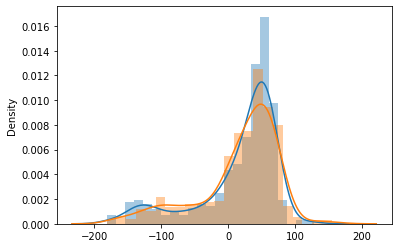

In [141]:
sns.distplot(df_ecg_pat_4[df_ecg_pat_4.index >= df_ecg_pat_4.index[225]][:256*2])
sns.distplot(df_ecg_pat_4[df_ecg_pat_4.index >= df_temp.index[24]][:256*2])

In [ ]:
# Voir d'où provient l'écart de sSQI si important

In [ ]:
# Decision Path
i = 40

print(f'Index {i}')
print(f'True value: {df_wrong_answers_val["consensus"].values[i]}')
print(f'Predicted value: {df_wrong_answers_val["dtc_pred"].values[i]}')
print(f'SQIs values: {df_wrong_answers_val.iloc[i]}')

viz = dtreeviz(ecg_qc_dtc.model,
                df_val_sqi.iloc[:,2:8].values,
                df_val_sqi['consensus'].values,
                target_name='quality',
                feature_names=feature_names,
                class_names=['noise', 'clean'],
                X=df_wrong_answers_val.iloc[:,2:8].values[i],
                show_just_path=True)

viz

In [15]:
# Computer SQIs

ecg_qc_dtc

In [9]:
loader.sampling_frequency_hz

256